In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_csv('Company_bankruptcy.csv')

In [3]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [4]:
df.shape

(6819, 96)

In [5]:
df['Bankrupt?'].value_counts()/len(df)*100

Bankrupt?
0    96.77372
1     3.22628
Name: count, dtype: float64

In [6]:
df.dtypes

Bankrupt?                                                     int64
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
                                                             ...   
 Liability to Equity                                        float64
 Degree of Financial Leverage (DFL)                         float64
 Interest Coverage Ratio (Interest expense to EBIT)         float64
 Net Income Flag                                              int64
 Equity to Liability                                        float64
Length: 96, dtype: object

In [7]:
def summary(df):
    summ=pd.DataFrame(df.dtypes,columns=['Data Type'])
    summ['#Missing']=df.isna().sum().values
    summ['Unique']=df.nunique().values
    desc=pd.DataFrame(df.describe(include='all').transpose())
    summ['min']=desc['min'].values
    summ['max']=desc['max'].values
    summ['mean']=desc['mean'].values
    summ['std']=desc['std'].values
    return summ
summary(df)[10:30]

,Data Type,#Missing,Unique,min,max,mean,std
Continuous interest rate (after tax),float64,0,3617,0.0,1.000000e+00,7.813814e-01,1.267900e-02
Operating Expense Rate,float64,0,2966,0.0,9.990000e+09,1.995347e+09,3.237684e+09
Research and development expense rate,float64,0,1536,0.0,9.980000e+09,1.950427e+09,2.598292e+09
Cash flow rate,float64,0,5557,0.0,1.000000e+00,4.674312e-01,1.703552e-02
Interest-bearing debt interest rate,float64,0,1080,0.0,9.900000e+08,1.644801e+07,1.082750e+08
Tax rate (A),float64,0,2488,0.0,1.000000e+00,1.150007e-01,1.386675e-01
Net Value Per Share (B),float64,0,2278,0.0,1.000000e+00,1.906606e-01,3.338977e-02
Net Value Per Share (A),float64,0,2285,0.0,1.000000e+00,1.906332e-01,3.347351e-02
Net Value Per Share (C),float64,0,2284,0.0,1.000000e+00,1.906724e-01,3.348014e-02
Persistent EPS in the Last Four Seasons,float64,0,1358,0.0,1.000000e+00,2.288129e-01,3.326261e-02


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

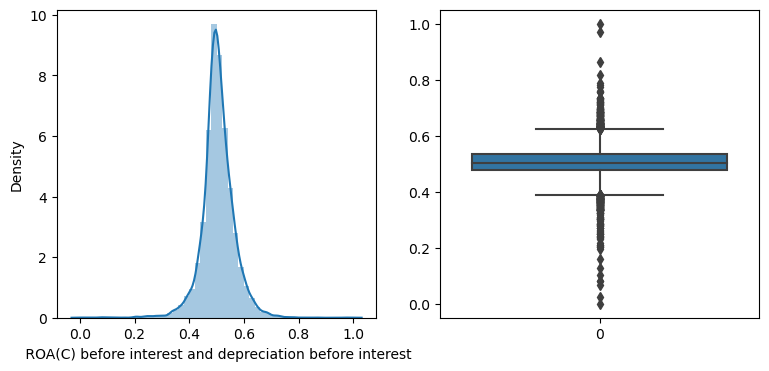

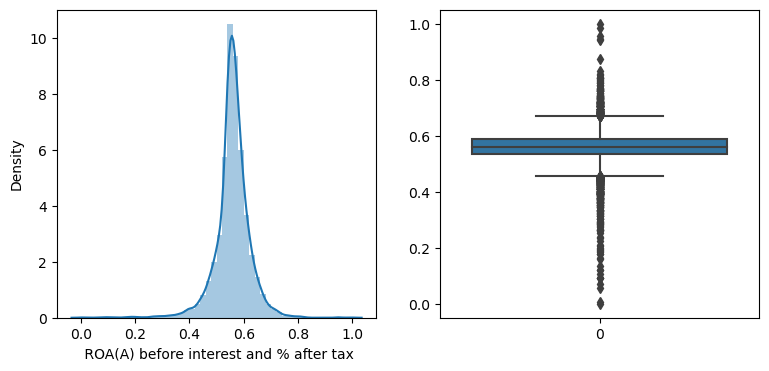

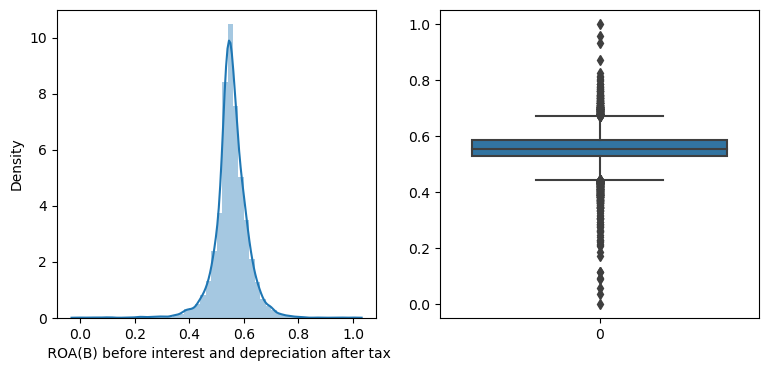

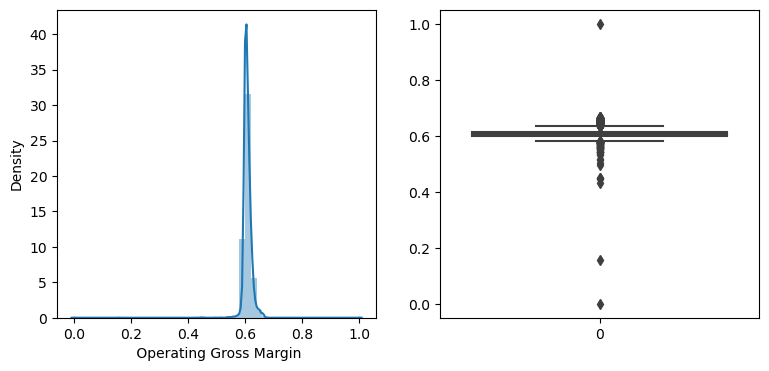

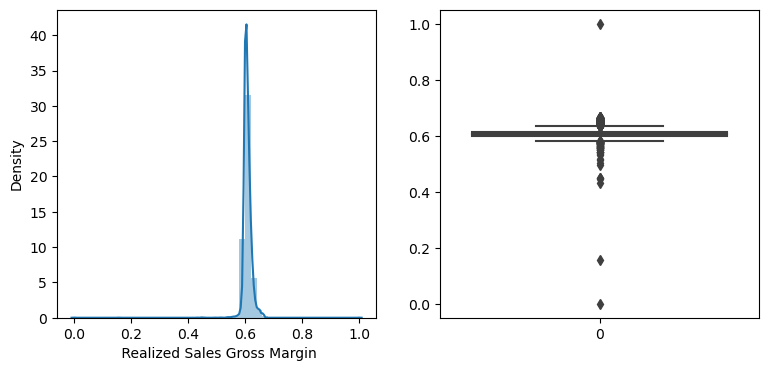

...

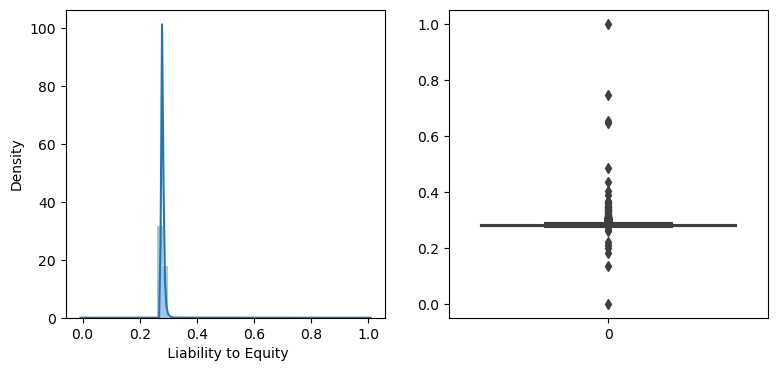

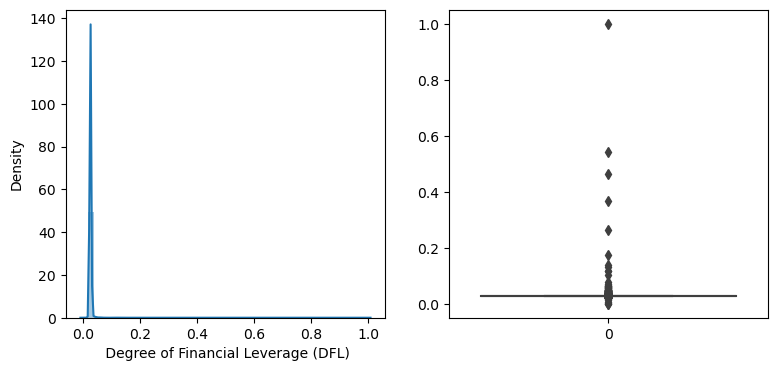

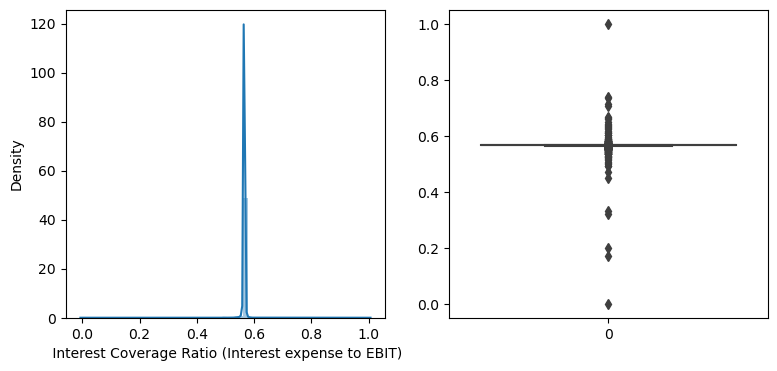

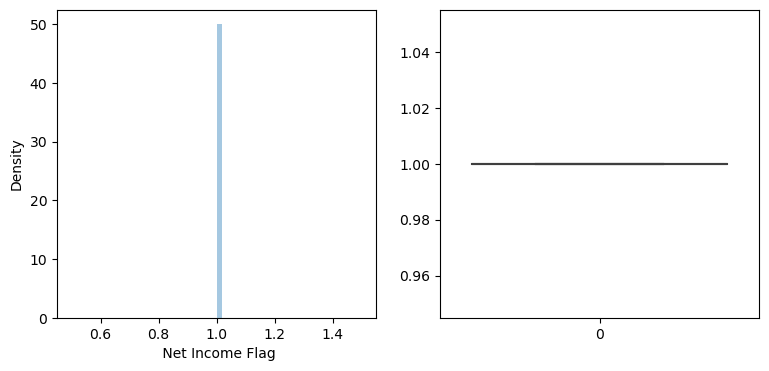

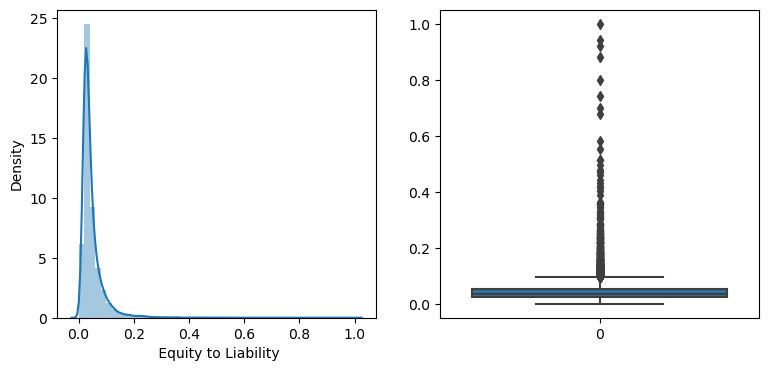

In [9]:
import warnings
warnings.filterwarnings('ignore')
for i in df.drop('Bankrupt?',axis=1).columns:
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(df[i])
    plt.subplot(132)
    sns.boxplot(df[i])
    plt.show()

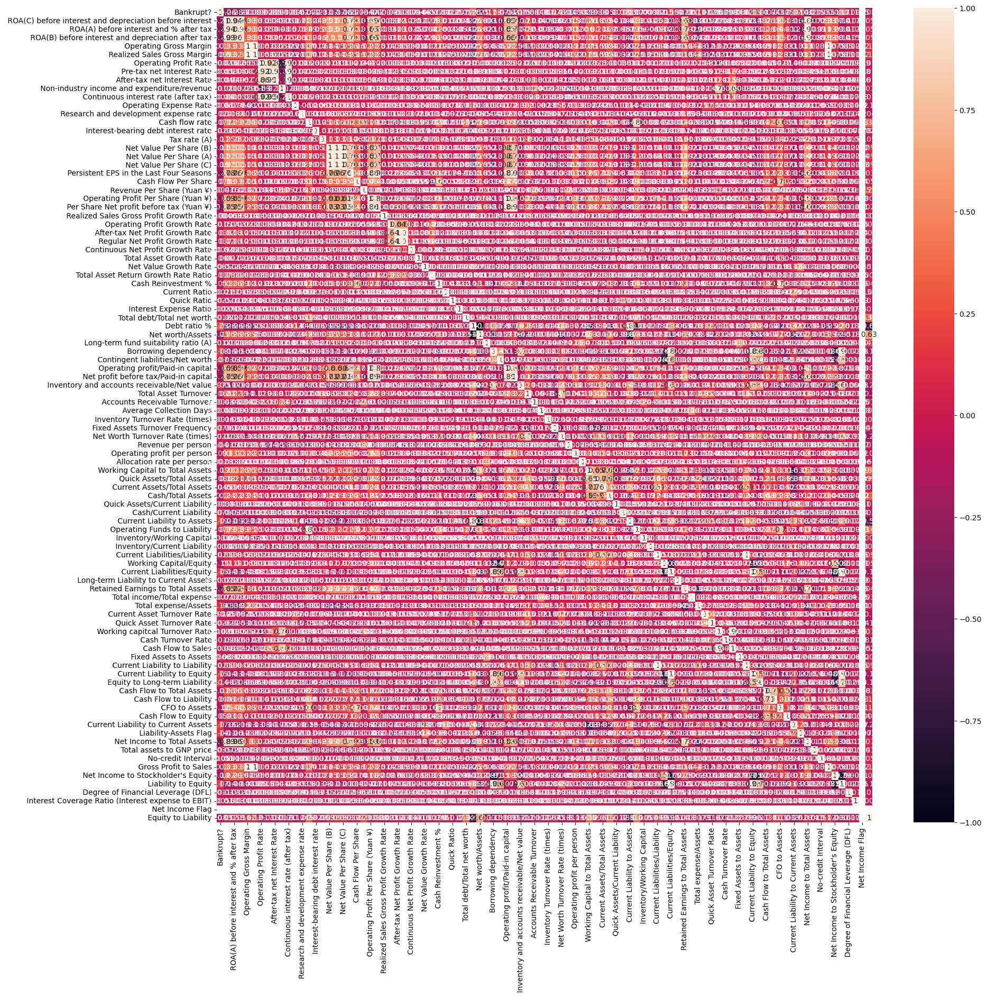

In [10]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [11]:
from sklearn.pipeline import Pipeline

In [12]:
X=df.drop('Bankrupt?',axis=1)
Y=df['Bankrupt?']

In [13]:
Y.value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

In [14]:
X.shape

(6819, 95)

In [15]:
from feature_engine.selection import DropConstantFeatures, DropCorrelatedFeatures, DropDuplicateFeatures

In [16]:
pipline=Pipeline(steps=[('constant',DropConstantFeatures(tol=0.998))
                        ,('correlated', DropCorrelatedFeatures(threshold=0.8)),
                        ('Duplicates', DropDuplicateFeatures())])

In [17]:
X=pipline.fit_transform(X)

In [18]:
X.shape

(6819, 68)

In [19]:
from imblearn.over_sampling import SMOTE

In [20]:
smote=SMOTE()

In [21]:
X,Y=smote.fit_resample(X,Y)

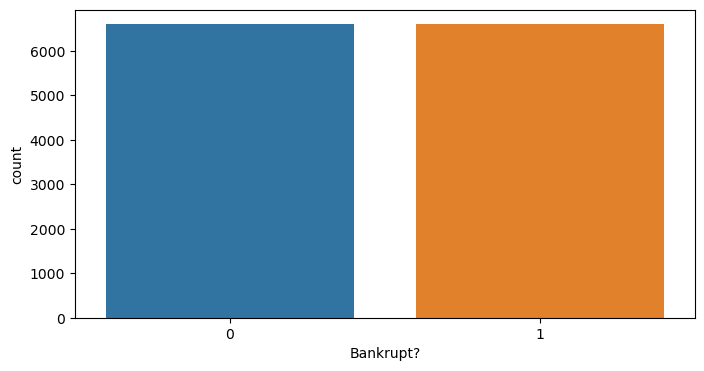

In [22]:
plt.figure(figsize=(8,4))
fig=sns.countplot(x=Y)
plt.show(fig)

In [23]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score

In [24]:
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.3,random_state=42)

In [25]:
from sklearn.feature_selection import SelectKBest, chi2, SelectPercentile, RFE

In [26]:
kbest=SelectKBest(k=20,score_func=chi2)
kbest.fit(X_train,y_train)

SelectKBest(k=20, score_func=<function chi2 at 0x15db08c20>)

In [27]:
selected_features=kbest.get_feature_names_out()
selected_features

array([' Operating Expense Rate',
       ' Research and development expense rate',
       ' Interest-bearing debt interest rate',
       ' Revenue Per Share (Yuan ¥)', ' Total Asset Growth Rate',
       ' Net Value Growth Rate', ' Quick Ratio',
       ' Accounts Receivable Turnover', ' Average Collection Days',
       ' Inventory Turnover Rate (times)',
       ' Fixed Assets Turnover Frequency', ' Revenue per person',
       ' Quick Assets/Current Liability', ' Cash/Current Liability',
       ' Inventory/Current Liability', ' Current Asset Turnover Rate',
       ' Quick Asset Turnover Rate', ' Cash Turnover Rate',
       ' Fixed Assets to Assets', ' Total assets to GNP price'],
      dtype=object)

In [28]:
from sklearn.ensemble import RandomForestClassifier

In [29]:
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=20,step=4,verbose=2)
rfe.fit(X_train,y_train)

Fitting estimator with 68 features.
Fitting estimator with 64 features.
Fitting estimator with 60 features.
Fitting estimator with 56 features.
Fitting estimator with 52 features.
Fitting estimator with 48 features.
Fitting estimator with 44 features.
Fitting estimator with 40 features.
Fitting estimator with 36 features.
Fitting estimator with 32 features.
Fitting estimator with 28 features.
Fitting estimator with 24 features.


RFE(estimator=RandomForestClassifier(), n_features_to_select=20, step=4,
    verbose=2)

In [30]:
rfe.get_feature_names_out()

array([' ROA(C) before interest and depreciation before interest',
       ' Non-industry income and expenditure/revenue',
       ' Interest-bearing debt interest rate', ' Net Value Per Share (B)',
       ' Persistent EPS in the Last Four Seasons',
       ' Net Value Growth Rate', ' Quick Ratio',
       ' Interest Expense Ratio', ' Total debt/Total net worth',
       ' Debt ratio %', ' Borrowing dependency',
       ' Average Collection Days', ' Operating profit per person',
       ' Allocation rate per person',
       ' Retained Earnings to Total Assets',
       ' Total income/Total expense', ' Cash Turnover Rate',
       ' Degree of Financial Leverage (DFL)',
       ' Interest Coverage Ratio (Interest expense to EBIT)',
       ' Equity to Liability'], dtype=object)

In [31]:
#Interest-bearing debt interest rate
#Net Value Growth Rate
#Quick Ratio
#Average Collection Days
#Cash Turnover Rate
#Operating Expense Rate
#Research and development expense rate
#Interest-bearing debt interest rate
#Persistent EPS in the Last Four Seasons
#Equity to Liability
#Total income/Total expense
#Current Liability to Current Assets
#Retained Earnings to Total Assets
#Allocation rate per person
#Debt ratio %
#Cash/Current Liability
#Revenue per person
#Total assets to GNP price
#Fixed Assets Turnover Frequency
#Borrowing dependency
#Accounts Receivable Turnover
#Total debt/Total net worth
#Degree of Financial Leverage (DFL)
#Interest Coverage Ratio (Interest expense to EBIT)
#Quick Assets/Current Liability

In [32]:
col=[' Interest-bearing debt interest rate',' Net Value Growth Rate',' Quick Ratio',' Average Collection Days'
    ,' Cash Turnover Rate',' Operating Expense Rate',' Research and development expense rate',
    ' Persistent EPS in the Last Four Seasons',' Equity to Liability',' Total income/Total expense',' Current Liability to Current Assets',
    ' Retained Earnings to Total Assets',' Allocation rate per person',' Debt ratio %',' Cash/Current Liability',' Revenue per person'
    ,' Total assets to GNP price',' Fixed Assets Turnover Frequency',' Borrowing dependency',' Accounts Receivable Turnover',
    ' Total debt/Total net worth',' Degree of Financial Leverage (DFL)',' Interest Coverage Ratio (Interest expense to EBIT)',
    ' Quick Assets/Current Liability','Bankrupt?']

In [33]:
X_ggb=df[col]

In [34]:
X_ggb[' Research and development expense rate'].value_counts()/len(X_ggb[' Research and development expense rate'])*100

 Research and development expense rate
0.000000e+00    20.882827
4.410000e+08     0.322628
6.450000e+08     0.307963
8.150000e+08     0.307963
3.230000e+08     0.278633
                  ...    
9.370000e+09     0.014665
2.353225e-04     0.014665
9.490000e+09     0.014665
2.399067e-04     0.014665
3.686040e-04     0.014665
Name: count, Length: 1536, dtype: float64

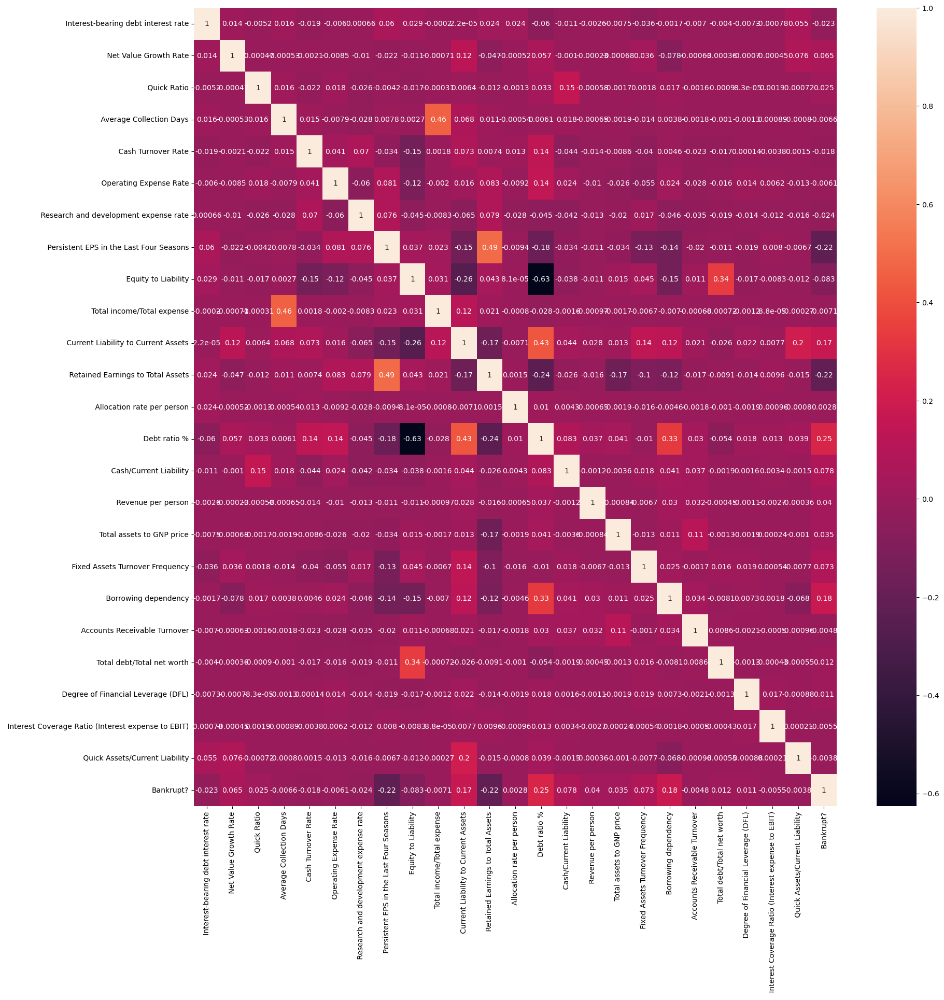

In [35]:
plt.figure(figsize=(20,20))
sns.heatmap(df[col].corr(),annot=True)
plt.show()

In [36]:
df[' Interest Coverage Ratio (Interest expense to EBIT)'].value_counts()/len(df[' Interest Coverage Ratio (Interest expense to EBIT)'])*100

 Interest Coverage Ratio (Interest expense to EBIT)
0.565158    8.505646
0.564050    0.014665
0.556468    0.014665
0.565404    0.014665
0.565294    0.014665
              ...   
0.565200    0.014665
0.566275    0.014665
0.566270    0.014665
0.564631    0.014665
0.565167    0.014665
Name: count, Length: 6240, dtype: float64

In [37]:
from scipy.stats import skew
skewness=skew(df[' Interest Coverage Ratio (Interest expense to EBIT)'])

In [38]:
skewness #Highly skewed variable 

-13.93646138523255

In [39]:
import scipy.stats
correlation_coefficient, p_value = scipy.stats.pearsonr(df[' Interest Coverage Ratio (Interest expense to EBIT)'],df['Bankrupt?'])

In [40]:
correlation_coefficient

-0.005509252071534234

In [41]:
df[' Interest Coverage Ratio (Interest expense to EBIT)']=np.exp(df[' Interest Coverage Ratio (Interest expense to EBIT)'])

In [42]:
skewness=skew(df[' Interest Coverage Ratio (Interest expense to EBIT)'])

In [43]:
skewness

1.5522664546559735

In [44]:
correlation_coefficient, p_value = scipy.stats.pearsonr(df[' Interest Coverage Ratio (Interest expense to EBIT)'],df['Bankrupt?'])

In [45]:
correlation_coefficient

-0.006762465818129885

In [46]:
#Variable Selections from XGBClassifier

In [47]:
import xgboost
from xgboost import XGBClassifier

In [48]:
xgb=XGBClassifier()
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

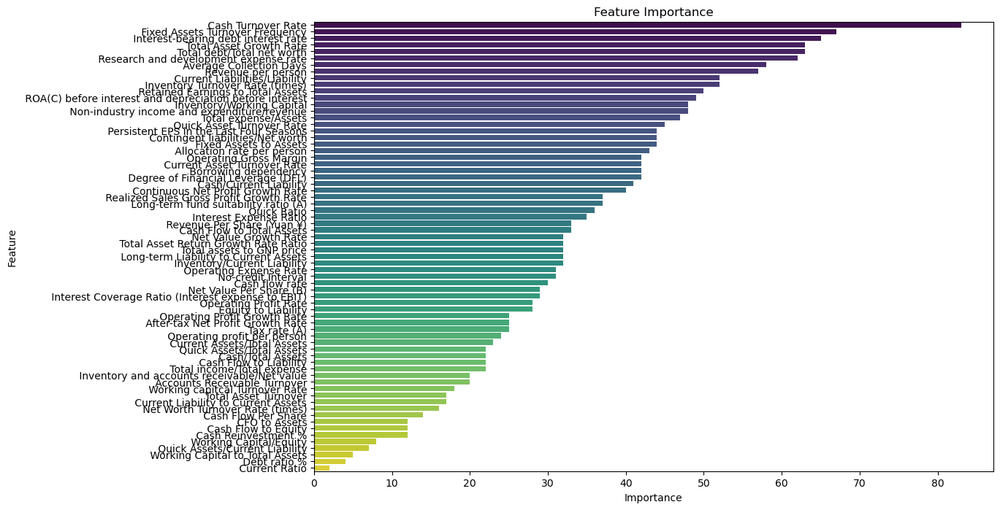

In [49]:
feat_imps = xgb.get_booster().get_score()
keys = list(feat_imps.keys())
values = list(feat_imps.values())
feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance",ascending=False).reset_index()
feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
plt.figure(figsize=(12,8))
fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
plt.title("Feature Importance")
plt.show(fig)
plt.close('all')

In [50]:
feat_imps_df[:20]

,Feature,Importance
0,Cash Turnover Rate,83.0
1,Fixed Assets Turnover Frequency,67.0
2,Interest-bearing debt interest rate,65.0
3,Total Asset Growth Rate,63.0
4,Total debt/Total net worth,63.0
5,Research and development expense rate,62.0
6,Average Collection Days,58.0
7,Revenue per person,57.0
8,Current Liabilities/Liability,52.0
9,Inventory Turnover Rate (times),52.0


In [51]:
from sklearn.tree import DecisionTreeClassifier

In [52]:
dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)

DecisionTreeClassifier()

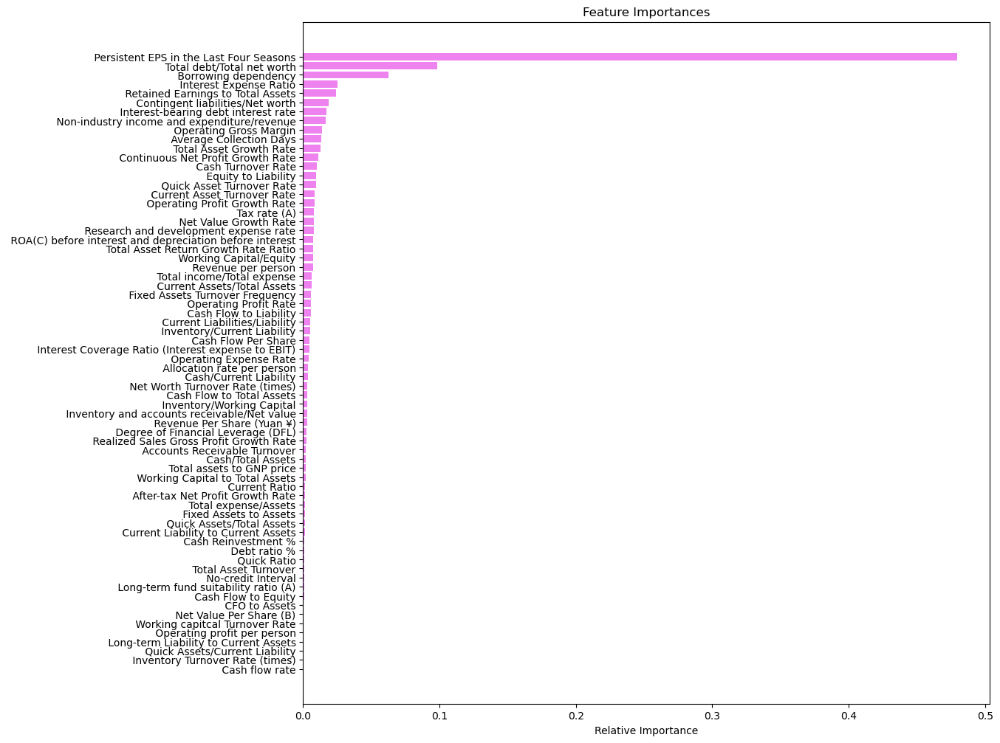

In [53]:
importances = dt.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [54]:
#Selecting Final Train and Test Dataset for Modelling

In [55]:
final_X_train=X_train[[' Interest-bearing debt interest rate',' Net Value Growth Rate',' Quick Ratio',' Average Collection Days'
    ,' Cash Turnover Rate',' Operating Expense Rate',' Research and development expense rate',
    ' Persistent EPS in the Last Four Seasons',' Equity to Liability',' Total income/Total expense',' Current Liability to Current Assets',
    ' Retained Earnings to Total Assets',' Allocation rate per person',' Debt ratio %',' Cash/Current Liability',' Revenue per person'
    ,' Total assets to GNP price',' Fixed Assets Turnover Frequency',' Borrowing dependency',' Accounts Receivable Turnover',
    ' Total debt/Total net worth',' Degree of Financial Leverage (DFL)',' Interest Coverage Ratio (Interest expense to EBIT)',
    ' Quick Assets/Current Liability',' Current Asset Turnover Rate',' Inventory Turnover Rate (times)',
    ' Inventory/Working Capital',' Total Asset Growth Rate',' Non-industry income and expenditure/revenue',
     ' Fixed Assets to Assets',' Contingent liabilities/Net worth',' Current Liabilities/Liability']]

In [56]:
final_X_test=X_test[[' Interest-bearing debt interest rate',' Net Value Growth Rate',' Quick Ratio',' Average Collection Days'
    ,' Cash Turnover Rate',' Operating Expense Rate',' Research and development expense rate',
    ' Persistent EPS in the Last Four Seasons',' Equity to Liability',' Total income/Total expense',' Current Liability to Current Assets',
    ' Retained Earnings to Total Assets',' Allocation rate per person',' Debt ratio %',' Cash/Current Liability',' Revenue per person'
    ,' Total assets to GNP price',' Fixed Assets Turnover Frequency',' Borrowing dependency',' Accounts Receivable Turnover',
    ' Total debt/Total net worth',' Degree of Financial Leverage (DFL)',' Interest Coverage Ratio (Interest expense to EBIT)',
    ' Quick Assets/Current Liability',' Current Asset Turnover Rate',' Inventory Turnover Rate (times)',
    ' Inventory/Working Capital',' Total Asset Growth Rate',' Non-industry income and expenditure/revenue',
     ' Fixed Assets to Assets',' Contingent liabilities/Net worth',' Current Liabilities/Liability']]

In [57]:
print(final_X_train.shape)
print(final_X_test.shape)

(9238, 32)
(3960, 32)


In [58]:
#Feature Scaling

In [59]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

In [60]:
features=final_X_train.columns

In [61]:
final_X_train=ss.fit_transform(final_X_train)
final_X_train=pd.DataFrame(final_X_train,columns=features)
final_X_test=ss.fit_transform(final_X_test)
final_X_test=pd.DataFrame(final_X_test,columns=features)

In [62]:
final_X_train.head()

,Interest-bearing debt interest rate,Net Value Growth Rate,Quick Ratio,Average Collection Days,Cash Turnover Rate,Operating Expense Rate,Research and development expense rate,Persistent EPS in the Last Four Seasons,Equity to Liability,Total income/Total expense,...,Interest Coverage Ratio (Interest expense to EBIT),Quick Assets/Current Liability,Current Asset Turnover Rate,Inventory Turnover Rate (times),Inventory/Working Capital,Total Asset Growth Rate,Non-industry income and expenditure/revenue,Fixed Assets to Assets,Contingent liabilities/Net worth,Current Liabilities/Liability
0,-0.127527,-0.046159,-0.049063,-0.031371,2.283827,-0.588919,-0.685202,-1.084030,-0.512476,-0.018591,...,0.374915,-0.014705,1.492311,-0.682354,-0.059854,1.140753,-0.020416,-0.04043,-0.110920,-0.788510
1,-0.127527,-0.046159,-0.049063,-0.031371,-0.525099,1.877047,-0.503477,0.196607,0.338531,-0.011221,...,0.029964,-0.014705,1.704519,1.658852,0.091626,0.563969,0.060594,-0.04043,-0.057400,-2.019507
2,-0.127527,-0.046159,-0.049063,-0.031371,-0.042115,1.708624,1.138437,0.729285,-0.042358,0.014725,...,0.014804,-0.014705,-0.447560,2.542200,0.006212,-1.800299,0.040676,-0.04043,-0.063802,-0.664326
3,-0.127527,-0.046159,-0.049063,-0.031371,-0.234526,-0.588919,-0.366194,-0.663475,-0.392362,-0.020545,...,-0.779432,-0.014705,-0.284090,-0.295224,0.050311,0.299544,0.028424,-0.04043,-0.037156,-0.282799
4,-0.127527,-0.046159,-0.049063,-0.031371,-0.785769,2.407520,-0.379142,-1.008594,-0.441512,-0.038349,...,-0.228319,-0.014705,-0.447560,-0.682354,-0.048862,-1.870292,-0.008747,-0.04043,-0.032002,1.206266


In [63]:
final_X_test.head()

,Interest-bearing debt interest rate,Net Value Growth Rate,Quick Ratio,Average Collection Days,Cash Turnover Rate,Operating Expense Rate,Research and development expense rate,Persistent EPS in the Last Four Seasons,Equity to Liability,Total income/Total expense,...,Interest Coverage Ratio (Interest expense to EBIT),Quick Assets/Current Liability,Current Asset Turnover Rate,Inventory Turnover Rate (times),Inventory/Working Capital,Total Asset Growth Rate,Non-industry income and expenditure/revenue,Fixed Assets to Assets,Contingent liabilities/Net worth,Current Liabilities/Liability
0,-0.118831,-0.04709,-0.048628,-0.019909,0.354481,-0.593964,2.924324,-0.345208,-0.266122,-0.300800,...,-0.042102,-0.015893,-0.458213,-0.675725,-0.028473,0.243996,-0.000588,-0.048741,-0.024895,-1.166864
1,-0.118831,-0.04709,-0.048628,-0.019909,-0.055764,2.092268,-0.308916,-0.385278,-0.315354,-0.484697,...,-0.232439,-0.015893,-0.458213,-0.146543,0.224365,0.336702,-0.005486,-0.048741,-0.062590,-0.115132
2,-0.118831,-0.04709,-0.048628,-0.019909,-0.872977,1.957239,1.312810,15.386079,-0.003346,1.656389,...,-0.012735,-0.015893,-0.458213,-0.675725,-0.047127,-2.037213,0.019434,-0.048741,-0.064583,1.288158
3,-0.118831,-0.04709,-0.048628,-0.019909,-0.523893,-0.593964,-0.634158,-1.526047,-0.467174,-1.618875,...,-0.490351,-0.015893,-0.458213,1.247891,0.253099,-0.570641,0.018884,-0.048741,-0.011568,0.834611
4,-0.118831,-0.04709,-0.048628,-0.019909,0.089579,1.527127,0.485474,-0.295961,-0.431541,-0.607573,...,0.023131,-0.015893,1.329679,-0.069808,-0.086514,0.167818,0.013892,-0.048741,-0.064583,-0.663660


In [64]:
#Model Training and Evaluation

In [65]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, PrecisionRecallDisplay, RocCurveDisplay

In [66]:
models = []
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []
roc_auc_scores = []

In [67]:
def train_and_evaluate_model(model):
    model.fit(final_X_train,y_train)
    y_pred=model.predict(final_X_test)
    print("Classification Report")
    print(classification_report(y_test,y_pred))
    print('-'*50)
    ConfusionMatrixDisplay.from_predictions(y_test,y_pred)
    PrecisionRecallDisplay.from_predictions(y_test,y_pred)
    RocCurveDisplay.from_predictions(y_test,y_pred)
    acc=accuracy_score(y_test,y_pred)
    precision=precision_score(y_test,y_pred)
    recall=recall_score(y_test,y_pred)
    f1=f1_score(y_test,y_pred)
    roc_auc=roc_auc_score(y_test,y_pred)
    
    models.append(model)
    accuracy_scores.append(acc)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)
    roc_auc_scores.append(roc_auc)

In [68]:
from sklearn.linear_model import LogisticRegression

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      2005
           1       0.89      0.89      0.89      1955

    accuracy                           0.89      3960
   macro avg       0.89      0.89      0.89      3960
weighted avg       0.89      0.89      0.89      3960

--------------------------------------------------


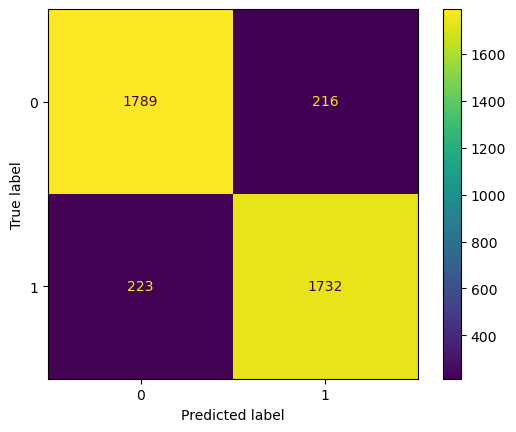

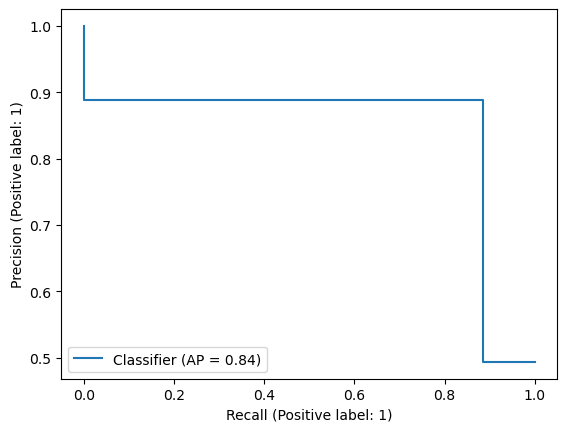

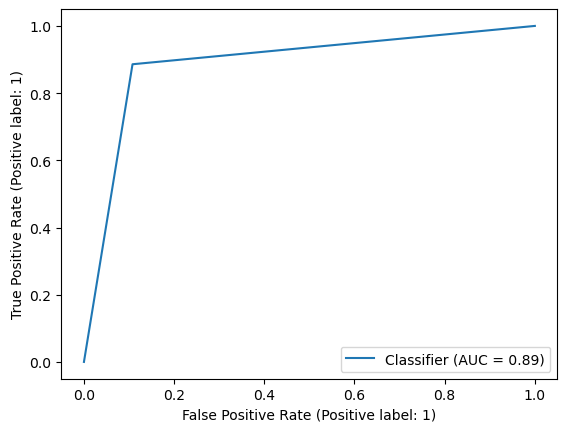

In [69]:
train_and_evaluate_model(LogisticRegression())

In [70]:
from sklearn.linear_model import SGDClassifier

Classification Report
              precision    recall  f1-score   support

           0       0.91      0.87      0.89      2005
           1       0.87      0.91      0.89      1955

    accuracy                           0.89      3960
   macro avg       0.89      0.89      0.89      3960
weighted avg       0.89      0.89      0.89      3960

--------------------------------------------------


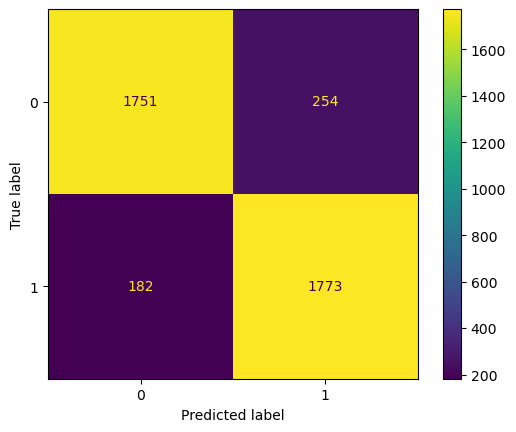

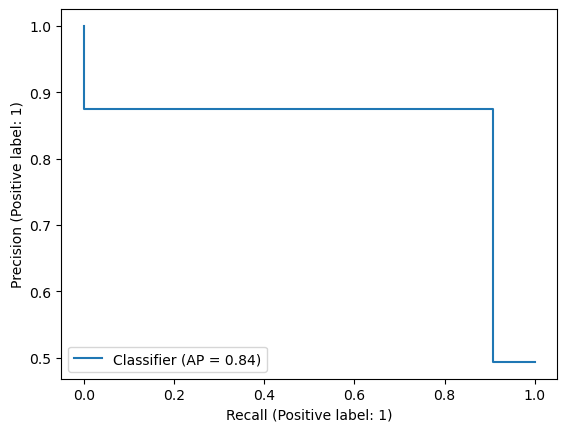

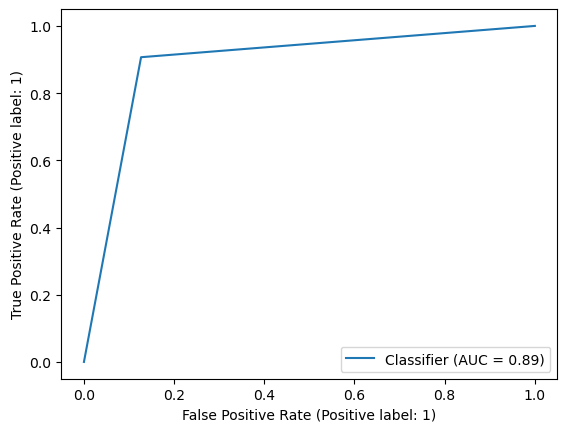

In [71]:
train_and_evaluate_model(SGDClassifier(loss='hinge',penalty='l2',alpha=0.001,l1_ratio=0))

In [72]:
from sklearn.neighbors import KNeighborsClassifier

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.90      0.95      2005
           1       0.91      1.00      0.95      1955

    accuracy                           0.95      3960
   macro avg       0.96      0.95      0.95      3960
weighted avg       0.96      0.95      0.95      3960

--------------------------------------------------


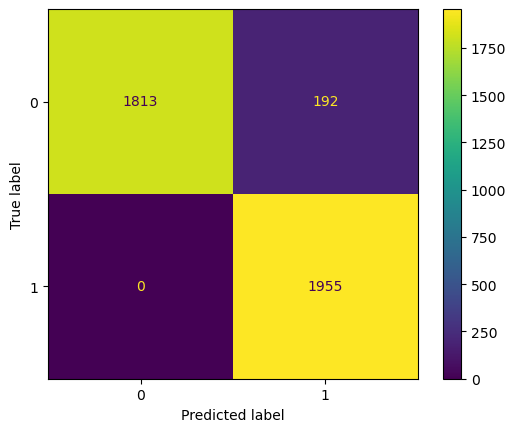

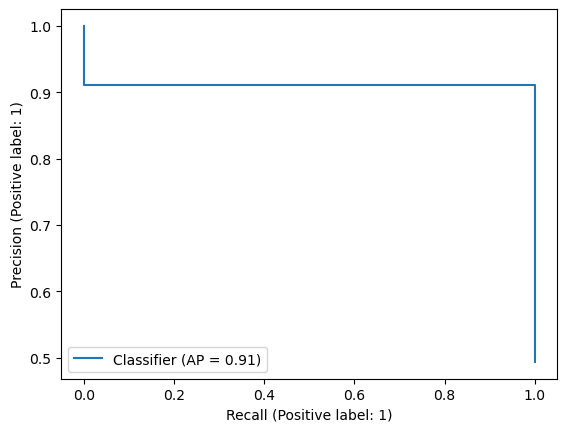

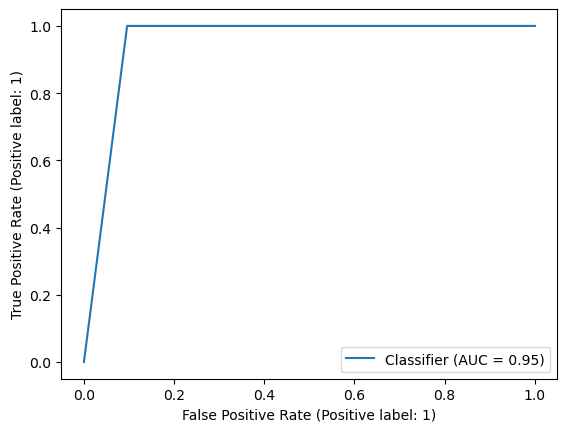

In [73]:
train_and_evaluate_model(KNeighborsClassifier())

In [74]:
from sklearn.naive_bayes import GaussianNB

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.00      0.01      2005
           1       0.49      1.00      0.66      1955

    accuracy                           0.50      3960
   macro avg       0.75      0.50      0.34      3960
weighted avg       0.75      0.50      0.33      3960

--------------------------------------------------


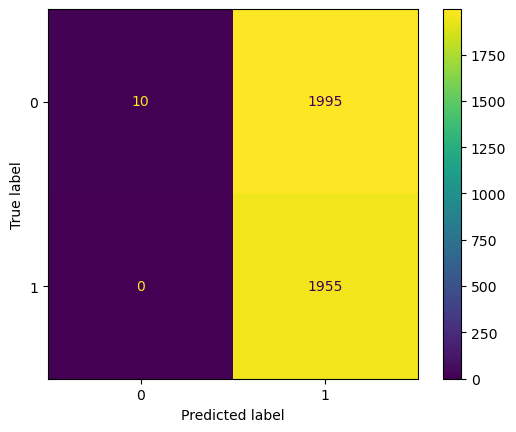

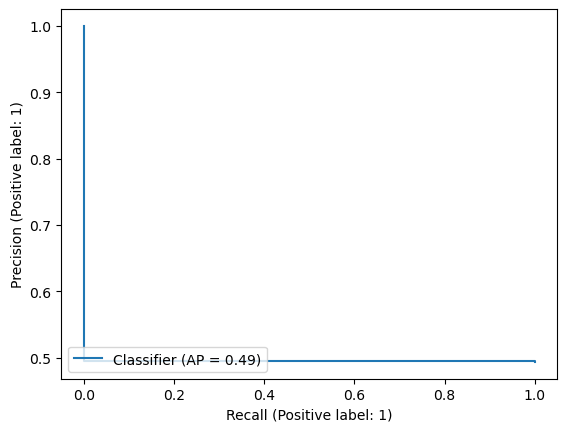

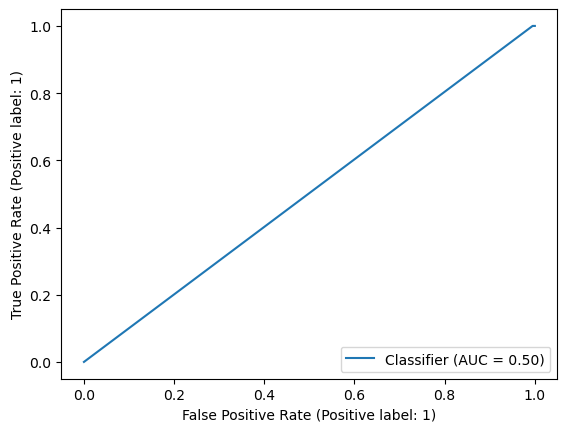

In [75]:
train_and_evaluate_model(GaussianNB())

In [76]:
from sklearn.svm import SVC, LinearSVC

Classification Report
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      2005
           1       0.91      0.95      0.93      1955

    accuracy                           0.93      3960
   macro avg       0.93      0.93      0.93      3960
weighted avg       0.93      0.93      0.93      3960

--------------------------------------------------


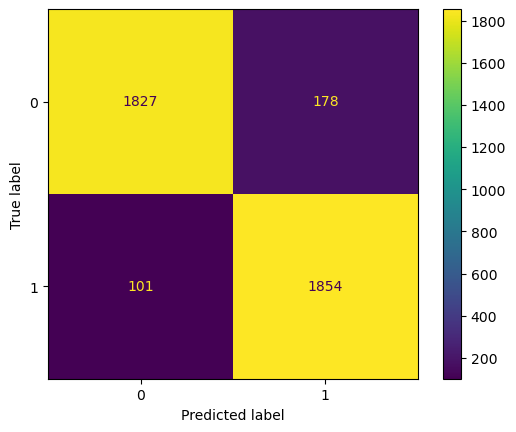

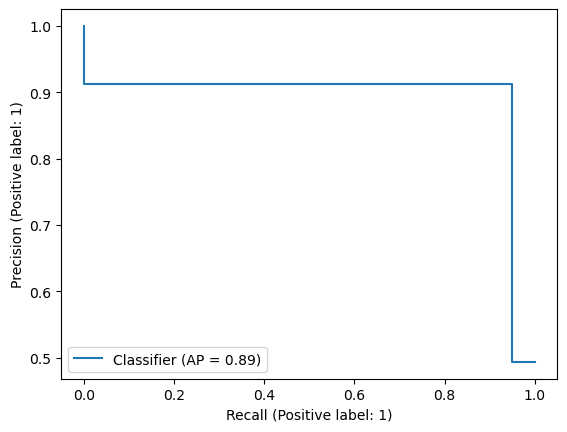

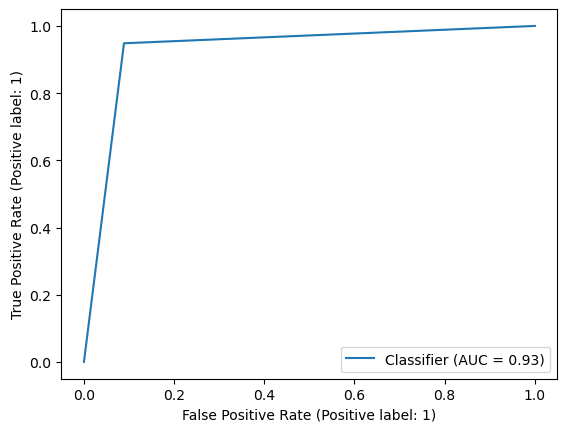

In [77]:
train_and_evaluate_model(SVC())

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.84      0.90      2005
           1       0.86      0.97      0.91      1955

    accuracy                           0.91      3960
   macro avg       0.91      0.91      0.91      3960
weighted avg       0.91      0.91      0.91      3960

--------------------------------------------------


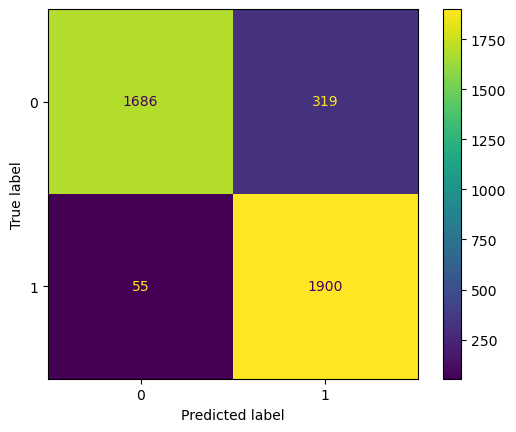

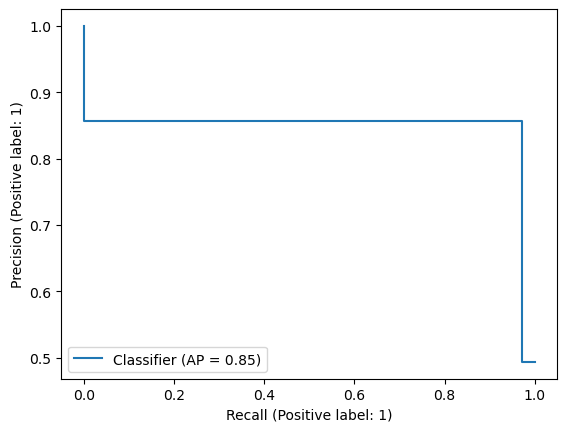

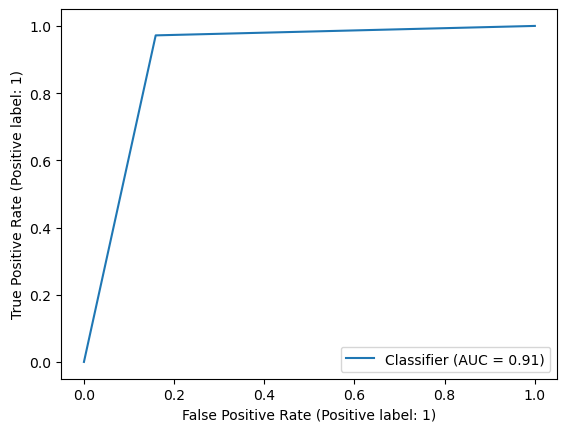

In [78]:
train_and_evaluate_model(SVC(kernel='poly'))

In [79]:
param_grid = {'C': [0.1,1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf','poly','linear']} 

In [80]:
from sklearn.model_selection import GridSearchCV

In [81]:
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=1)

When refit is set to True, the GridSearchCV will refit the model with the best parameters on the whole dataset after finding them.

verbose=1: It controls the verbosity of the grid search. The higher the number, the more messages you'll see. Setting it to 1 means you'll get some information about the progress of the grid search.

Classification Report
              precision    recall  f1-score   support

           0       0.91      0.87      0.89      2005
           1       0.87      0.91      0.89      1955

    accuracy                           0.89      3960
   macro avg       0.89      0.89      0.89      3960
weighted avg       0.89      0.89      0.89      3960

--------------------------------------------------


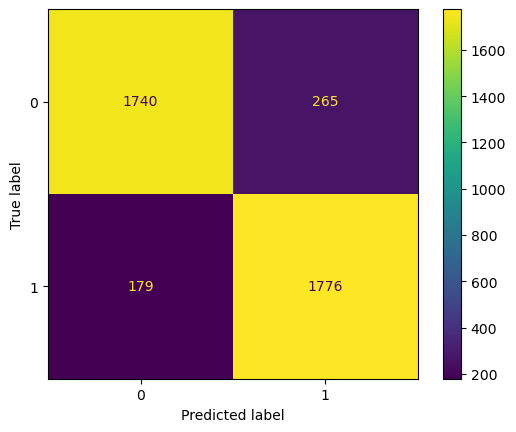

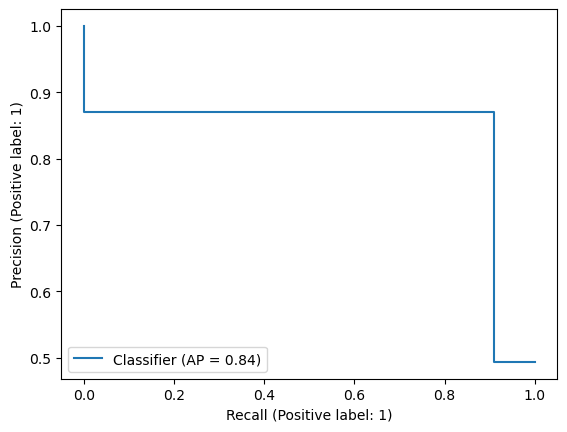

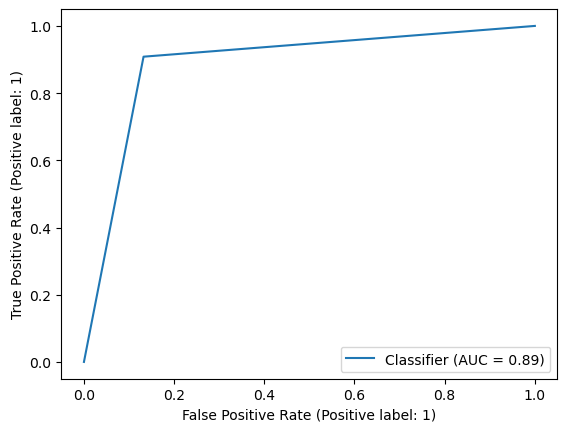

In [82]:
train_and_evaluate_model(SVC(C=10, gamma=0.0001, kernel='rbf'))

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      2005
           1       0.96      0.97      0.96      1955

    accuracy                           0.97      3960
   macro avg       0.97      0.97      0.97      3960
weighted avg       0.97      0.97      0.97      3960

--------------------------------------------------


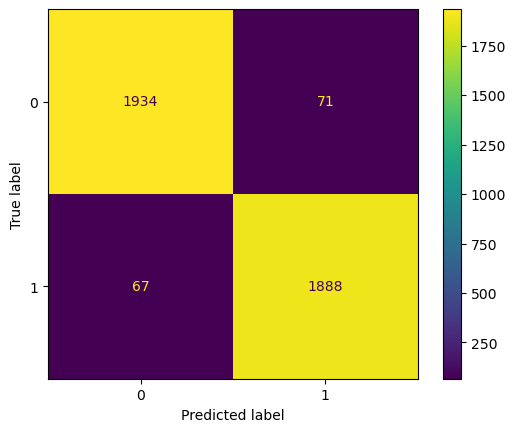

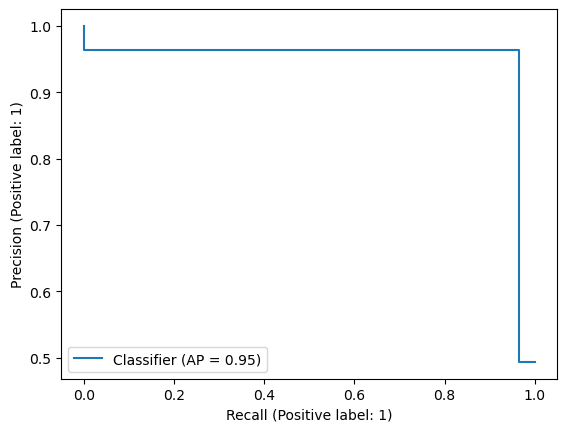

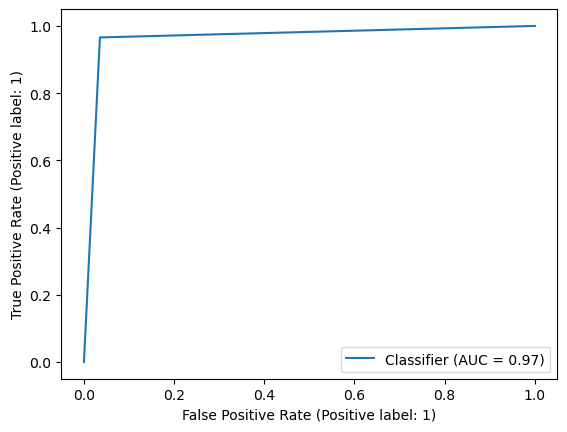

In [83]:
train_and_evaluate_model(RandomForestClassifier())

In [84]:
param_grid = {'n_estimators': [50,100,200,500], 'criterion': ['gini','entropy'], 
              'max_depth': [5,10,15,20],'max_features':['sqrt','log2',None],'min_samples_split':[2,5,10]} 

In [85]:
grid = GridSearchCV(RandomForestClassifier(),param_grid,refit=True,verbose=1,cv=5,return_train_score=False)

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.95      0.86      2005
           1       0.93      0.73      0.82      1955

    accuracy                           0.84      3960
   macro avg       0.86      0.84      0.84      3960
weighted avg       0.86      0.84      0.84      3960

--------------------------------------------------


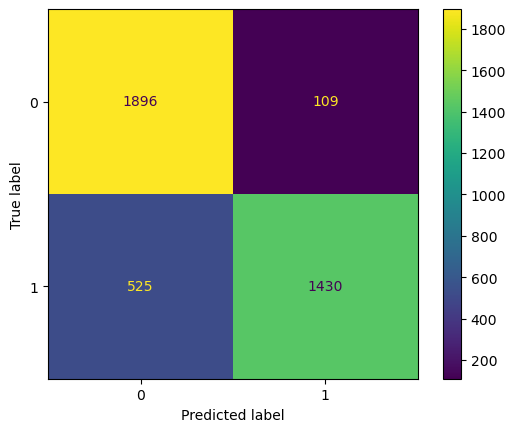

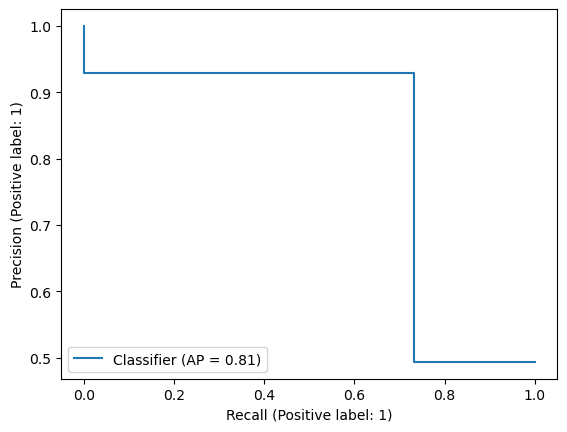

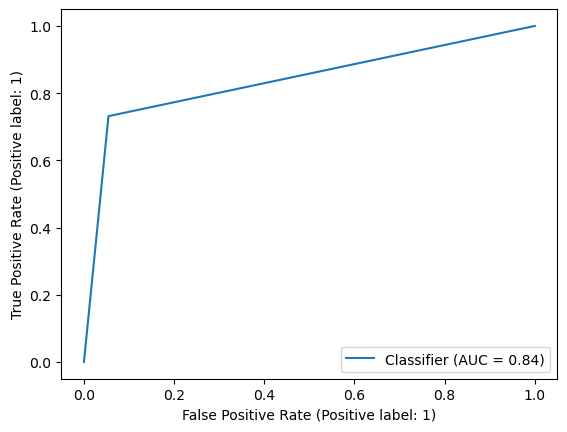

In [86]:
train_and_evaluate_model(RandomForestClassifier(n_estimators=500,criterion='gini',max_depth=20,max_features=None,min_samples_split=5))

In [87]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

Classification Report
              precision    recall  f1-score   support

           0       0.71      0.91      0.80      2005
           1       0.88      0.62      0.72      1955

    accuracy                           0.77      3960
   macro avg       0.79      0.77      0.76      3960
weighted avg       0.79      0.77      0.76      3960

--------------------------------------------------


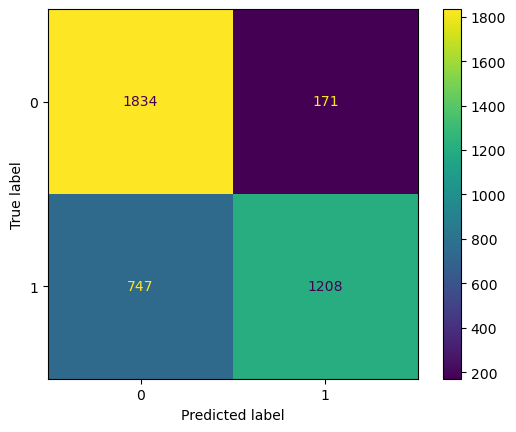

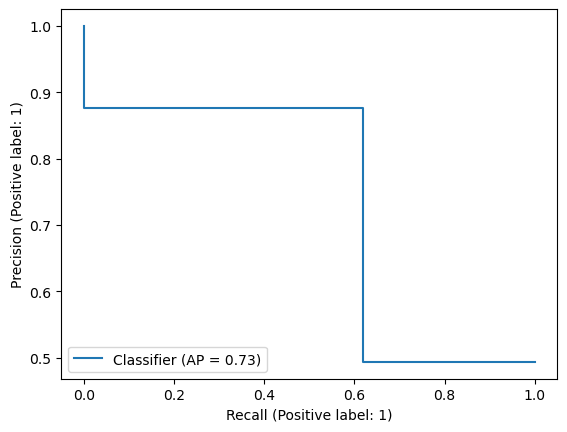

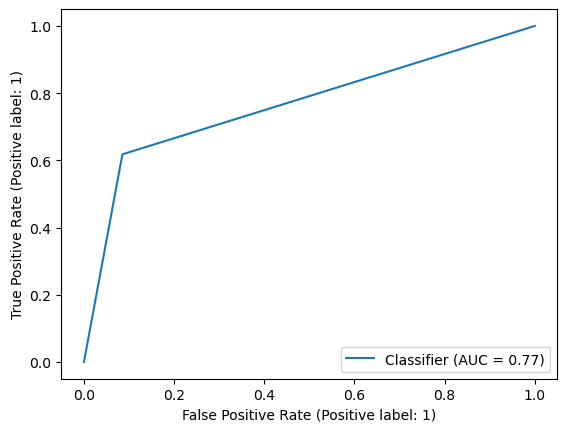

In [88]:
train_and_evaluate_model(DecisionTreeClassifier())

Classification Report
              precision    recall  f1-score   support

           0       0.72      0.92      0.81      2005
           1       0.89      0.64      0.74      1955

    accuracy                           0.78      3960
   macro avg       0.80      0.78      0.78      3960
weighted avg       0.80      0.78      0.78      3960

--------------------------------------------------


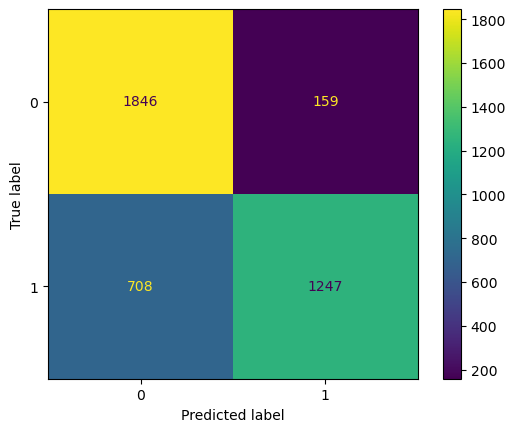

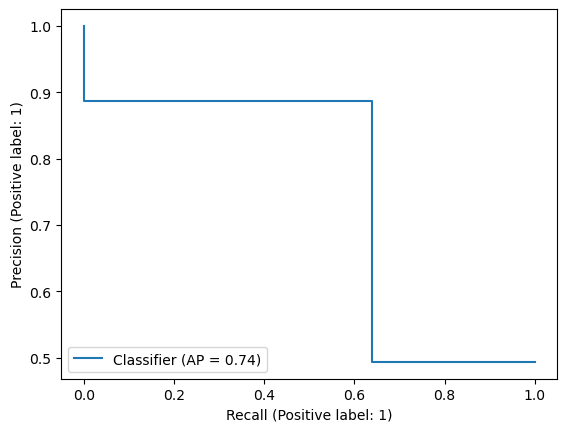

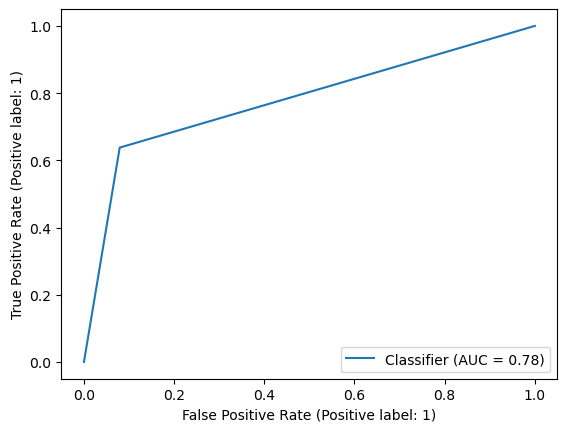

In [89]:
train_and_evaluate_model(AdaBoostClassifier(estimator=DecisionTreeClassifier(),
                                            n_estimators=300,learning_rate=0.01))

Classification Report
              precision    recall  f1-score   support

           0       0.91      0.92      0.92      2005
           1       0.92      0.91      0.91      1955

    accuracy                           0.91      3960
   macro avg       0.91      0.91      0.91      3960
weighted avg       0.91      0.91      0.91      3960

--------------------------------------------------


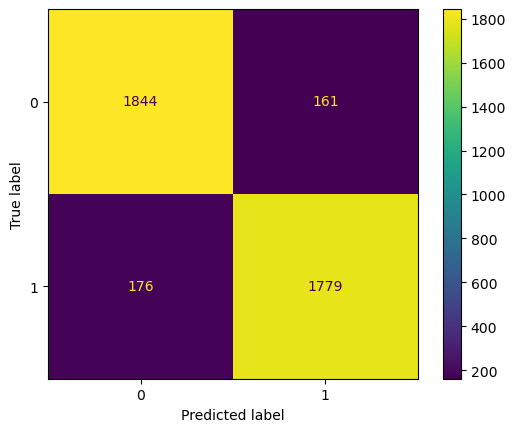

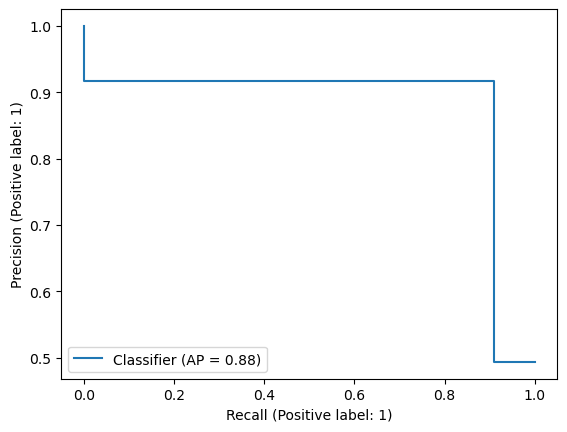

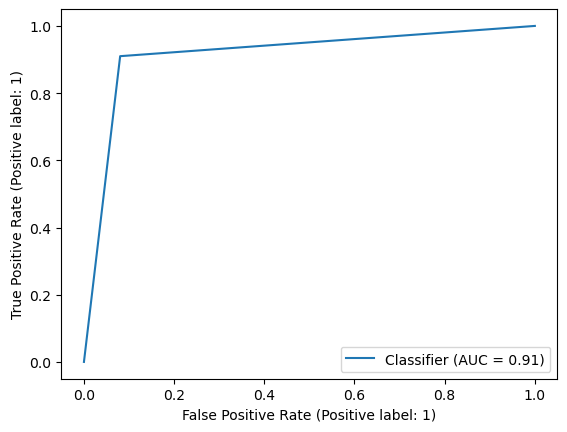

In [90]:
train_and_evaluate_model(GradientBoostingClassifier(criterion='squared_error',min_samples_split=5))

Classification Report
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      2005
           1       0.97      0.96      0.96      1955

    accuracy                           0.96      3960
   macro avg       0.96      0.96      0.96      3960
weighted avg       0.96      0.96      0.96      3960

--------------------------------------------------


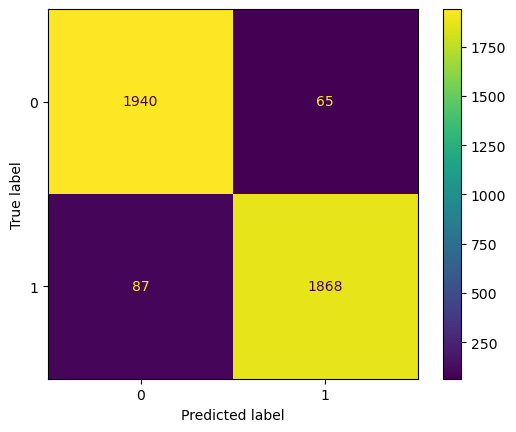

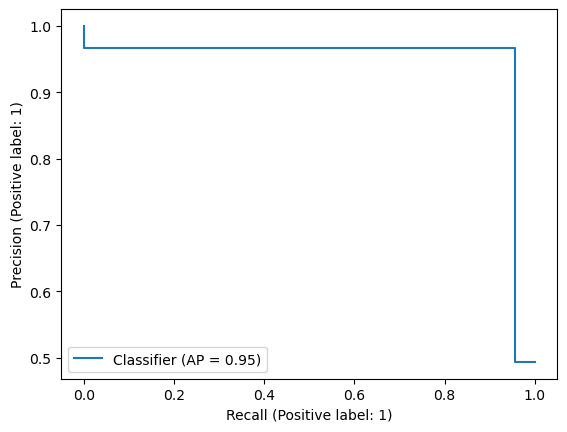

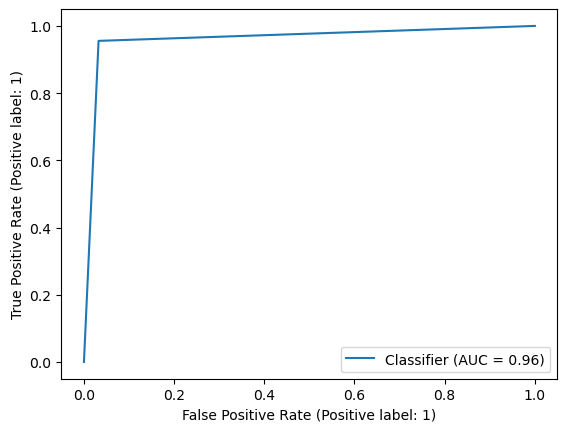

In [92]:
train_and_evaluate_model(XGBClassifier())

In [93]:
from sklearn.ensemble import StackingClassifier

Classification Report
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2005
           1       0.97      0.93      0.95      1955

    accuracy                           0.95      3960
   macro avg       0.95      0.95      0.95      3960
weighted avg       0.95      0.95      0.95      3960

--------------------------------------------------


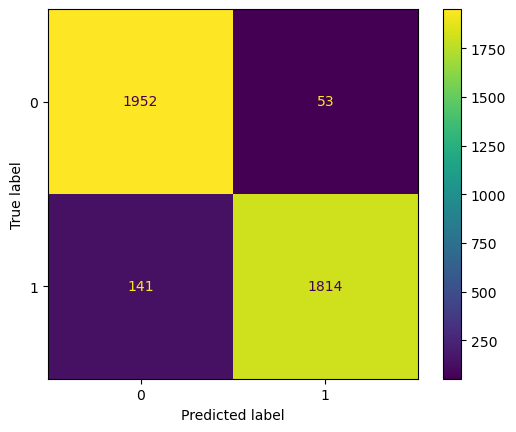

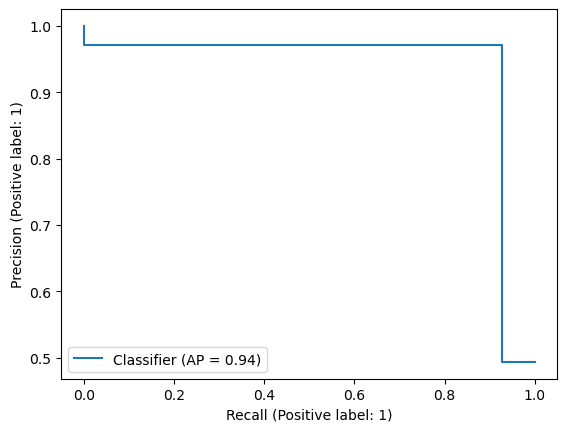

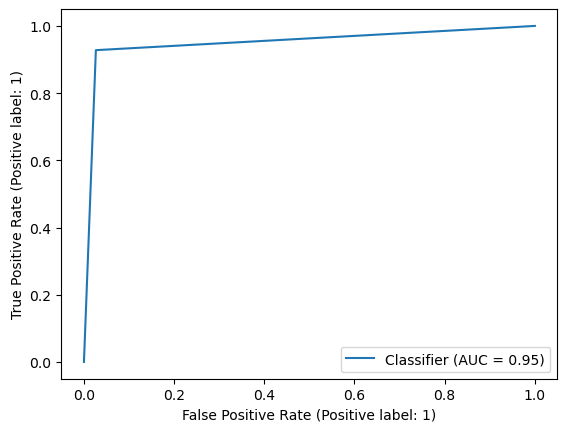

In [95]:
train_and_evaluate_model(StackingClassifier(estimators=[('DT',DecisionTreeClassifier()),
                                                       ('Ada',AdaBoostClassifier()),
                                                       ('XGB',XGBClassifier())],final_estimator=LogisticRegression()))

In [96]:
model_performance=pd.DataFrame({'model':models,'Accuracy':accuracy_scores,'Precision':precision_scores
                               ,'recall':recall_scores,'F1':f1_scores,'roc':roc_auc_scores}).sort_values('F1',ascending=False).reset_index(drop=True)

In [97]:
model_performance

,model,Accuracy,Precision,recall,F1,roc
0,"(DecisionTreeClassifier(max_features='sqrt', r...",0.965152,0.963757,0.965729,0.964742,0.965159
1,"XGBClassifier(base_score=None, booster=None, c...",0.961616,0.966374,0.955499,0.960905,0.961540
2,KNeighborsClassifier(),0.951515,0.910573,1.000000,0.953194,0.952120
3,"StackingClassifier(estimators=[('DT', Decision...",0.951010,0.971612,0.927877,0.949241,0.950722
4,SVC(),0.929545,0.912402,0.948338,0.930023,0.929780
5,"([DecisionTreeRegressor(max_depth=3, min_sampl...",0.914899,0.917010,0.909974,0.913479,0.914838
6,SVC(kernel='poly'),0.905556,0.856242,0.971867,0.910398,0.906382
7,"SGDClassifier(alpha=0.001, l1_ratio=0)",0.889899,0.874692,0.906905,0.890507,0.890111
8,"SVC(C=10, gamma=0.0001)",0.887879,0.870162,0.908440,0.888889,0.888135
9,LogisticRegression(),0.889141,0.889117,0.885934,0.887522,0.889101


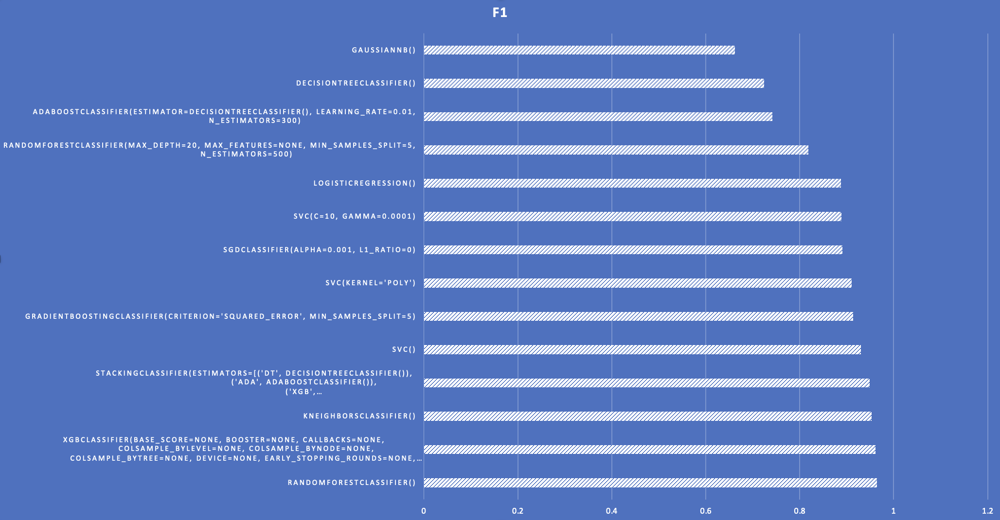

In [110]:
from IPython.display import Image
Image(filename='Screenshot 2023-12-17 at 00.08.14.png')